In [46]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [47]:
# ! pip uninstall numba -y && pip install numba

In [48]:
import os
import sys

# Получаем абсолютный путь к корневой директории проекта (директория выше текущей)
root_path = os.path.abspath(os.path.join(os.getcwd(), '..'))

# Добавляем корневую директорию в sys.path
if root_path not in sys.path:
    sys.path.append(root_path)

In [49]:
from model_loaders import load_ss_model
import weightwatcher as ww
from matplotlib import pyplot as plt
from pipeline import separate_audio
import torch
from utils import parse_yaml
from models.clap_encoder import CLAP_Encoder
import IPython.display as ipd
from models.audiosep_lora import AudioSepLora

In [50]:
SS_CONFIG_PATH = '../config/audiosep_base.yaml'
CLAP_CKPT_PATH = '../checkpoint/music_speech_audioset_epoch_15_esc_89.98.pt'
AUDIOSEP_CKPT_PATH = '../checkpoint/audiosep_base_4M_steps.ckpt'

In [59]:
def describe_weights(model, plot=False):
    watcher = ww.WeightWatcher()
    details = watcher.analyze(model=model, plot=plot)
    summary = watcher.get_summary(details)

    return details, summary

def plot_hist(details):
    avg_alpha = details.alpha.mean()

    title=f"WeightWatcher Alpha"
    details.alpha.plot.hist(bins=100)
    plt.title(title)
    plt.axvline(x=avg_alpha, color='green',label=f"<alpha> = {avg_alpha:0.3f}")
    plt.legend()

In [52]:
device = torch.device('cuda')
configs = parse_yaml(SS_CONFIG_PATH)

In [53]:
audio_file = '../audios/test.wav'
output_file = '../separation_result/test.wav'

In [54]:
query_encoder = CLAP_Encoder(pretrained_path = CLAP_CKPT_PATH).eval().to(device)
base_model = load_ss_model(configs=configs, checkpoint_path=AUDIOSEP_CKPT_PATH, query_encoder=query_encoder).eval().to(device)

2024-03-15 00:45:18,484 - INFO - Loading HTSAT-base model config.
2024-03-15 00:45:19,818 - INFO - Loading pretrained HTSAT-base-roberta weights (../checkpoint/music_speech_audioset_epoch_15_esc_89.98.pt).


In [74]:
from models.audiosep_lora_and_tuned_embeddings import AudioSepLoraAndTunedEmbeddings

query_encoder_for_lora = CLAP_Encoder(pretrained_path = CLAP_CKPT_PATH).eval().to(device)
base_model_for_lora = load_ss_model(configs=configs, checkpoint_path=AUDIOSEP_CKPT_PATH, query_encoder=query_encoder_for_lora).eval().to(device)

lora_model = AudioSepLoraAndTunedEmbeddings.load_from_checkpoint(
    checkpoint_path='../checkpoints/train_audiosep_lora_and_tuned_embeddings/audiosep_lora_and_tuned_embeddings_musdb18,timestamp=1710451587.1702235/epoch=1.ckpt',
    strict=False,
    pretrained_audiosep_model = base_model_for_lora,
    loss_function=None,
    waveform_mixer=None,
    lr_lambda_func=None
) \
    .eval() \
    .to(device)

merged_lora_model = lora_model.model.merge_and_unload()

2024-03-15 00:53:58,896 - INFO - Loading HTSAT-base model config.
2024-03-15 00:54:00,153 - INFO - Loading pretrained HTSAT-base-roberta weights (../checkpoint/music_speech_audioset_epoch_15_esc_89.98.pt).


In [75]:
text = 'drums'
output_file2 = '../separation_result/test2.wav'

separate_audio(merged_lora_model, audio_file, text, output_file2, device, use_chunk=True)
ipd.Audio(output_file2)

Separating audio from [../audios/test.wav] with textual query: [drums]
Separated audio written to [../separation_result/test2.wav]


In [18]:
plt.rcParams["figure.figsize"] = (20,3)

{'log_norm': 3.4622441728944704, 'alpha': 3.4710740844774923, 'alpha_weighted': 6.590802155253461, 'log_alpha_norm': 7.088332035155279, 'log_spectral_norm': 2.1900739450051367, 'stable_rank': 39.89981500874082}


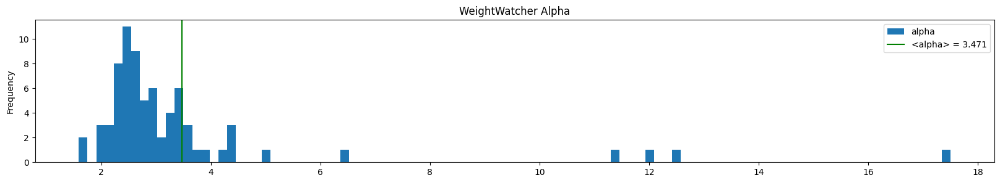

In [19]:
base_details, base_summary = describe_weights(base_model.ss_model)
plot_hist(base_details)
print(base_summary)

{'log_norm': 3.4625237768444386, 'alpha': 3.4810198359307916, 'alpha_weighted': 6.602738922849918, 'log_alpha_norm': 7.097703453421001, 'log_spectral_norm': 2.190207907170823, 'stable_rank': 39.93407408496772}


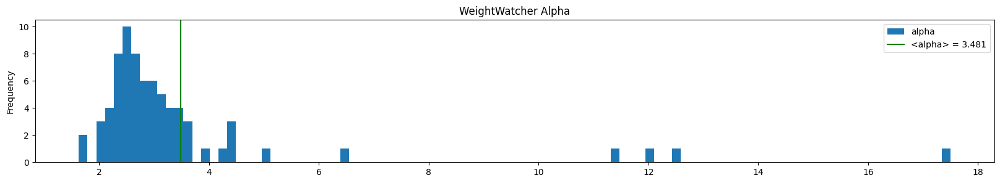

In [20]:
lora_details, lora_summary = describe_weights(merged_lora_model.ss_model)
plot_hist(lora_details)
print(lora_summary)

In [21]:
watcher = ww.WeightWatcher()
avg_dW, avg_db, distances = watcher.distances(base_model.ss_model, merged_lora_model.ss_model)
avg_dW, avg_db

(2.062, 0.0)

In [22]:
distances

,method,name,delta_W,delta_b,M,N,b_shape,longname
layer_id,,,,,,,,
14,raw,Conv2d,0.205322,0.0,3,32,unknown,base.encoder_block1.conv_block1.conv1
15,raw,Conv2d,0.299805,0.0,3,32,unknown,base.encoder_block1.conv_block1.conv2
20,raw,Conv2d,0.667969,0.0,3,64,unknown,base.encoder_block2.conv_block1.conv1
21,raw,Conv2d,0.603027,0.0,3,64,unknown,base.encoder_block2.conv_block1.conv2
22,raw,Conv2d,0.277100,0.0,1,64,unknown,base.encoder_block2.conv_block1.shortcut
...,...,...,...,...,...,...,...,...
151,raw,Linear,0.000000,0.0,64,512,64,film.decoder_block5->conv_block2->beta2
152,raw,Linear,0.000000,0.0,64,512,64,film.decoder_block6->beta1
153,raw,Linear,0.000000,0.0,64,512,64,film.decoder_block6->beta2


In [23]:
print(merged_lora_model)

AudioSep(
  (ss_model): ResUNet30(
    (base): ResUNet30_Base(
      (stft): STFT(
        (conv_real): Conv1d(1, 1025, kernel_size=(2048,), stride=(320,), bias=False)
        (conv_imag): Conv1d(1, 1025, kernel_size=(2048,), stride=(320,), bias=False)
      )
      (istft): ISTFT(
        (conv_real): Conv1d(2048, 2048, kernel_size=(1,), stride=(1,), bias=False)
        (conv_imag): Conv1d(2048, 2048, kernel_size=(1,), stride=(1,), bias=False)
      )
      (bn0): BatchNorm2d(1025, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
      (pre_conv): Conv2d(1, 32, kernel_size=(1, 1), stride=(1, 1))
      (encoder_block1): EncoderBlockRes1B(
        (conv_block1): ConvBlockRes(
          (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
          (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.01, affine=True, track_running_stats=True)
          (conv1): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
       

In [24]:
conv_distances = distances[distances['name']=='Conv2d']

In [25]:
import pandas as pd

df_split = conv_distances['longname'].str.split('.', expand=True)

# Объединение разделенных частей с исходным DataFrame
df_expanded = pd.concat([df_split, conv_distances['delta_W']], axis=1)

# Группировка и суммирование значений
# Уровень группировки будет увеличиваться на каждом шаге
for level in range(df_expanded.shape[1] - 1):  # Исключаем колонку 'value'
    grouped_df = df_expanded.groupby(list(range(level + 1))).sum().reset_index()
    grouped_df = grouped_df.sort_values(by='delta_W', ascending=False)
    print(f"Группировка по уровню {level + 1}:\n", grouped_df, "\n")


Группировка по уровню 1:
       0     delta_W
0  base  152.660217 

Группировка по уровню 2:
        0               1    delta_W
1   base  decoder_block1  31.027344
2   base  decoder_block2  26.769531
0   base    conv_block7a  22.582031
11  base  encoder_block5  20.145508
3   base  decoder_block3  15.482422
12  base  encoder_block6  13.160156
10  base  encoder_block4   9.620117
4   base  decoder_block4   5.648926
9   base  encoder_block3   3.788086
5   base  decoder_block5   1.889648
8   base  encoder_block2   1.548096
7   base  encoder_block1   0.505127
6   base  decoder_block6   0.493225 

Группировка по уровню 3:
        0               1            2    delta_W
1   base  decoder_block1  conv_block2  31.027344
2   base  decoder_block2  conv_block2  26.769531
0   base    conv_block7a  conv_block1  22.582031
11  base  encoder_block5  conv_block1  20.145508
3   base  decoder_block3  conv_block2  15.482422
12  base  encoder_block6  conv_block1  13.160156
10  base  encoder_block4  conv_

In [26]:
base_details[base_details['warning']!= '']

,layer_id,name,D,M,N,Q,alpha,alpha_weighted,entropy,has_esd,...,sigma,spectral_norm,stable_rank,status,sv_max,sv_min,warning,weak_rank_loss,xmax,xmin
0,14,Conv2d,0.036115,32,32,1.000000,1.625762,2.685497,0.574751,True,...,0.050425,44.857925,5.573885,success,6.697606,0.008506,over-trained,1,44.857925,0.046496
4,22,Conv2d,0.165235,32,64,2.000000,1.915685,1.194452,0.874048,True,...,0.195225,4.202542,8.390074,success,2.050010,0.180604,over-trained,0,4.202542,0.399682
32,104,Conv2d,0.126922,64,128,2.000000,1.591179,1.194884,0.785966,True,...,0.086232,5.635631,6.681611,success,2.373948,0.106389,over-trained,0,5.635631,0.071787
55,137,Linear,0.125938,384,512,1.333333,12.464368,7.480280,0.957606,True,...,2.563511,3.982292,110.104331,success,1.995568,0.149133,under-trained,0,3.982292,3.171669
59,141,Linear,0.111302,384,512,1.333333,17.504085,10.467236,0.957819,True,...,4.577410,3.962672,110.475005,success,1.990646,0.141731,under-trained,0,3.962672,3.390436
63,145,Linear,0.117309,256,512,2.000000,11.353159,6.613540,0.968601,True,...,2.375178,3.824095,89.565486,success,1.955529,0.349874,under-trained,0,3.824095,3.035746
67,149,Linear,0.146874,128,512,4.000000,12.083487,6.527582,0.980869,True,...,3.074006,3.469020,59.340818,success,1.862531,0.647535,under-trained,0,3.469020,2.835847
71,153,Linear,0.154655,64,512,8.000000,6.438762,3.241981,0.988078,True,...,1.134060,3.187939,35.848996,success,1.785480,0.881179,under-trained,0,3.187939,2.055767


In [27]:
lora_details[lora_details['warning']!= '']

,layer_id,name,D,M,N,Q,alpha,alpha_weighted,entropy,has_esd,...,sigma,spectral_norm,stable_rank,status,sv_max,sv_min,warning,weak_rank_loss,xmax,xmin
0,14,Conv2d,0.035771,32,32,1.000000,1.627570,2.689176,0.574863,True,...,0.050571,44.901882,5.570990,success,6.700887,0.008719,over-trained,0,44.901882,0.046779
32,104,Conv2d,0.125055,64,128,2.000000,1.745855,1.313006,0.785760,True,...,0.127913,5.650286,6.716935,success,2.377033,0.110892,over-trained,0,5.650286,0.170800
55,137,Linear,0.125938,384,512,1.333333,12.464368,7.480280,0.957606,True,...,2.563511,3.982292,110.104331,success,1.995568,0.149133,under-trained,0,3.982292,3.171669
59,141,Linear,0.111302,384,512,1.333333,17.504085,10.467236,0.957819,True,...,4.577410,3.962672,110.475005,success,1.990646,0.141731,under-trained,0,3.962672,3.390436
63,145,Linear,0.117309,256,512,2.000000,11.353159,6.613540,0.968601,True,...,2.375178,3.824095,89.565486,success,1.955529,0.349874,under-trained,0,3.824095,3.035746
67,149,Linear,0.146874,128,512,4.000000,12.083487,6.527582,0.980869,True,...,3.074006,3.469020,59.340818,success,1.862531,0.647535,under-trained,0,3.469020,2.835847
71,153,Linear,0.154655,64,512,8.000000,6.438762,3.241981,0.988078,True,...,1.134060,3.187939,35.848996,success,1.785480,0.881179,under-trained,0,3.187939,2.055767


In [28]:
import numpy as np

watcher = ww.WeightWatcher()
layer1_iterator = watcher.make_layer_iterator(model=base_model.ss_model)
layer2_iterator = watcher.make_layer_iterator(model=merged_lora_model.ss_model)

metrics_df = pd.DataFrame(columns=['layer_name', 'base_norm', 'lora_norm', 'norm_of_diff', 'diff_of_norms'])
for layer1, layer2 in zip(layer1_iterator, layer2_iterator):
    if layer1.name != 'Conv2d':
        continue
    if layer1.longname != layer2.longname:
        raise Exception('layer names are not equal!')

    has_weights1, W1, has_biases1, b1  = layer1.get_weights_and_biases()
    W1 = W1.astype(np.float32)
    has_weights2, W2, has_biases2, b2  = layer2.get_weights_and_biases()
    W2 = W2.astype(np.float32)

    if has_weights1 and has_weights2:
        norm1 = np.linalg.norm(W1)
        norm2 = np.linalg.norm(W2)
        metrics_df = metrics_df.append({'layer_name': layer1.longname, 'base_norm': norm1, 'lora_norm': norm2, 'norm_of_diff': watcher.matrix_distance(W1, W2), 'diff_of_norms': np.linalg.norm(W1) - np.linalg.norm(W2)}, ignore_index=True)

metrics_df

,layer_name,base_norm,lora_norm,norm_of_diff,diff_of_norms
0,base.encoder_block1.conv_block1.conv1,22.364733,22.370022,0.205286,-0.005289
1,base.encoder_block1.conv_block1.conv2,13.917473,13.918465,0.299886,-0.000992
2,base.encoder_block2.conv_block1.conv1,41.262066,41.261425,0.667914,0.000641
3,base.encoder_block2.conv_block1.conv2,33.789303,33.791451,0.602854,-0.002148
4,base.encoder_block2.conv_block1.shortcut,8.398543,8.402390,0.276941,-0.003847
5,base.encoder_block3.conv_block1.conv1,78.449585,78.448441,1.170854,0.001144
6,base.encoder_block3.conv_block1.conv2,68.120689,68.155800,2.081628,-0.035110
7,base.encoder_block3.conv_block1.shortcut,13.060258,13.087352,0.535278,-0.027094
8,base.encoder_block4.conv_block1.conv1,140.816345,140.868027,3.293005,-0.051682
9,base.encoder_block4.conv_block1.conv2,132.886292,132.999069,5.206294,-0.112778


In [57]:
www = torch.load('../checkpoints/train_audiosep_lora_and_tuned_embeddings/audiosep_lora_and_tuned_embeddings_musdb18,timestamp=1710451587.1702235/epoch=29.ckpt')
print([v for k, v in www['state_dict'].items() if 'tuned_embedding_layer' in k.lower()])

[tensor([[ 0.0166,  0.0281, -0.0111,  ...,  0.0407, -0.0121, -0.0102],
        [ 0.0319,  0.0660,  0.0244,  ..., -0.0274, -0.0411,  0.0348],
        [ 0.0254,  0.0406, -0.0255,  ..., -0.0383,  0.0288, -0.0426],
        ...,
        [-0.0144,  0.0039,  0.0382,  ...,  0.0242,  0.0489, -0.0261],
        [ 0.0127, -0.0580, -0.0169,  ...,  0.0013, -0.0206,  0.0182],
        [-0.0279,  0.0315,  0.0303,  ..., -0.0407,  0.0340, -0.0109]],
       device='cuda:0'), tensor([-0.0371, -0.0080, -0.0129, -0.0094,  0.0143, -0.0005,  0.0205, -0.0043,
         0.0123,  0.0273, -0.0380,  0.0274, -0.0433, -0.0370, -0.0041, -0.0354,
         0.0331, -0.0274,  0.0049,  0.0054,  0.0418,  0.0377, -0.0411, -0.0393,
         0.0285,  0.0212,  0.0024, -0.0060,  0.0361,  0.0322,  0.0133,  0.0419],
       device='cuda:0'), tensor([[-0.1314, -0.1073, -0.0262,  ..., -0.0535,  0.1458, -0.0158],
        [ 0.0520,  0.1699,  0.1527,  ...,  0.1071, -0.1204,  0.0234],
        [-0.0581, -0.0286,  0.0630,  ...,  0.0726, -0.

{'log_norm': 1.0122522421992395, 'alpha': 6.047793339097564, 'alpha_weighted': 1.0877303038222057, 'log_alpha_norm': 1.860584015439517, 'log_spectral_norm': -0.11124931979910423, 'stable_rank': 13.951769614933468}


,layer_id,name,D,M,N,Q,alpha,alpha_weighted,entropy,has_esd,...,sigma,spectral_norm,stable_rank,status,sv_max,sv_min,warning,weak_rank_loss,xmax,xmin
0,3,model.base_model.model.ss_model.base.encoder_b...,0.078416,8,32,4.0,3.234998,-3.278064,0.950946,True,...,0.401417,0.096981,17.294603,success,0.311418,0.106374,,0,0.096981,0.021868
1,5,model.base_model.model.ss_model.base.encoder_b...,0.111366,8,32,4.0,2.873554,-2.220771,0.928224,True,...,0.354069,0.168721,14.172639,success,0.410757,0.099827,,0,0.168721,0.031840
2,7,model.base_model.model.ss_model.base.encoder_b...,0.132304,8,32,4.0,2.478910,-2.353047,0.947278,True,...,0.218053,0.112402,23.669252,success,0.335264,0.117863,,0,0.112402,0.022337
3,9,model.base_model.model.ss_model.base.encoder_b...,0.109505,8,64,8.0,1.905896,-1.462472,0.922932,True,...,0.110673,0.170867,22.387268,success,0.413361,0.122332,over-trained,0,0.170867,0.013419
4,13,model.base_model.model.ss_model.base.encoder_b...,0.081229,8,64,8.0,2.101015,-1.249788,0.902762,True,...,0.144570,0.254185,15.195017,success,0.504168,0.122935,,0,0.254185,0.018223
5,15,model.base_model.model.ss_model.base.encoder_b...,0.084979,8,128,16.0,1.920467,-0.388234,0.817196,True,...,0.116899,0.627833,11.801378,success,0.792359,0.136046,over-trained,0,0.627833,0.019901
6,19,model.base_model.model.ss_model.base.encoder_b...,0.125301,8,128,16.0,1.738696,-0.483449,0.881503,True,...,0.087056,0.527166,12.853923,success,0.726062,0.143748,over-trained,0,0.527166,0.014283
7,21,model.base_model.model.ss_model.base.encoder_b...,0.140994,8,256,32.0,31.181153,-1.674806,0.864055,True,...,11.407404,0.883665,16.509756,success,0.940035,0.170876,under-trained,0,0.883665,0.806805
8,25,model.base_model.model.ss_model.base.encoder_b...,0.166947,8,256,32.0,1.581855,0.005770,0.839112,True,...,0.068572,1.008434,15.175764,success,1.004208,0.151164,over-trained,0,1.008434,0.016069
9,27,model.base_model.model.ss_model.base.encoder_b...,0.167345,8,384,48.0,1.679358,0.454255,0.755195,True,...,0.080063,1.864204,12.287486,success,1.365358,0.160090,over-trained,0,1.864204,0.019152


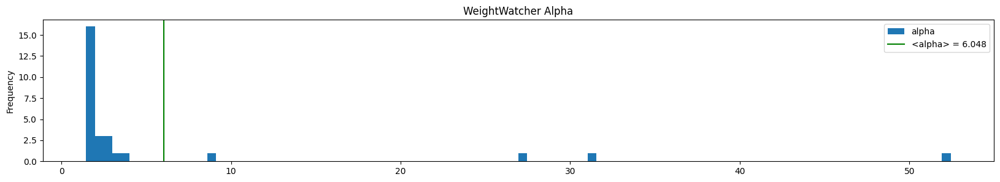

In [58]:
test_details, test_summary = describe_weights(www)
plot_hist(test_details)
print(test_summary)
test_details